  ============================================================



   T96 Model Analysis Using the 9 Directional Derivative Formulas

   (8-panel visualization + extra panels)



   NOTE:

    - 出力（数値・図・タイトル等）を変えず、重複と構造だけ整理しています。

    - # %% / # %% [markdown] でセル分割できる形にしています。



  ============================================================

In [1]:
import os
import re
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.collections import LineCollection
from mpl_toolkits.axes_grid1 import make_axes_locatable

from geopack import recalc, dip, smgsm_vectorized, t96_vectorized, field_line_directional_derivatives_vectorized, verify_antisymmetry_relations, get_curvature_torsion_from_derivatives



Load IGRF coefficients ...


  -------------------------

  PNG saving utilities

  -------------------------

In [2]:
SAVE_PNG = True           # 保存ON/OFF
PNG_DIR  = "png_outputs"  # 保存先フォルダ
PNG_DPI  = 300            # 解像度
PNG_VERBOSE = False       # Trueで保存パスをprint

_png_counter = 0

def _sanitize_filename(s, maxlen=180):
    s = str(s)
    s = re.sub(r"\s+", " ", s).strip()
    # Windows等でも安全な文字だけに寄せる（日本語などは "_" に置換され得ます）
    s = re.sub(r"[^\w\-. ]+", "_", s)
    s = s.replace(" ", "_")
    return s[:maxlen]

def save_fig_png(fig, name, out_dir=PNG_DIR, dpi=PNG_DPI):
    global _png_counter
    if not SAVE_PNG:
        return None
    os.makedirs(out_dir, exist_ok=True)
    _png_counter += 1
    base = _sanitize_filename(name)
    path = os.path.join(out_dir, f"{_png_counter:03d}_{base}.png")
    fig.savefig(path, dpi=dpi, bbox_inches="tight", facecolor="white")
    if PNG_VERBOSE:
        print(f"Saved PNG: {path}")
    return path

def finish_figure(fig, name, show=True, close=True):
    save_fig_png(fig, name)
    if show:
        plt.show()
    if close:
        plt.close(fig)


  -------------------------

  User-tunable parameters

  -------------------------

In [3]:
delta_fd = 1e-5     # finite difference step (Re)
delta_min = 1e-5    # small-value clipping for derivative fields (display)

L0 = 0.5            # segment length scale (Re)
step = 2            # subsampling for overlay density

perp_thresh = 0.05  # |B_in_plane|/|B| < this -> dot instead of segment
dot_size = 4
dot_alpha = 0.85

# Layout knobs
CBAR_PAD = 0.18
CBAR_SIZE = "4.5%"
TITLE_FONTSIZE = 16
TIGHT_HPAD = 1.2
TIGHT_WPAD = 0.9

UNIT_STR = r"$1/R_{\mathrm{E}}$"   # e.g. "1/Re" or r"1/R$_E$"



  -------------------------

  Keys / panels

  -------------------------

In [4]:
main_keys = [
    'dT_dT_n', 'dT_dT_b', 'dn_dT_b', 'dT_dn_n', 'dT_dn_b',
    'dn_dn_b', 'dn_db_b', 'dn_db_T', 'db_db_T'
]
anti_keys = [
    'dn_dT_T', 'db_dT_T', 'db_dT_n', 'dn_dn_T', 'db_dn_T',
    'db_dn_n', 'db_db_n', 'dT_db_n', 'dT_db_b'
]

plot_info_8 = [
    ('dT_dT_n', r'(∂T/∂T)·n $=\Gamma^{\hat{2}}_{\hat{1}\hat{1}}$', 'Parallel Curvature', 'plasma'),
    ('db_dT_n', r'(∂b/∂T)·n $=\Gamma^{\hat{2}}_{\hat{1}\hat{3}}$', 'Parallel Torsion', 'RdBu_r'),
    ('dT_dn_n', r'(∂T/∂n)·n $=\Gamma^{\hat{2}}_{\hat{2}\hat{1}}$', 'Normal Curvature', 'RdBu_r'),
    ('dT_db_b', r'(∂T/∂b)·b $=\Gamma^{\hat{3}}_{\hat{3}\hat{1}}$', 'Binormal Curvature', 'RdBu_r'),
    ('dn_db_b', r'(∂n/∂b)·b $=\Gamma^{\hat{3}}_{\hat{3}\hat{2}}$', 'Binormal Curvature', 'RdBu_r'),
    ('db_dn_n', r'(∂b/∂n)·n $=\Gamma^{\hat{2}}_{\hat{2}\hat{3}}$', 'Normal Curvature', 'RdBu_r'),
    ('dT_dn_b', r'(∂T/∂n)·b $=\Gamma^{\hat{3}}_{\hat{2}\hat{1}}$', 'Normal Torsion', 'RdBu_r'),
    ('dT_db_n', r'(∂T/∂b)·n $=\Gamma^{\hat{2}}_{\hat{3}\hat{1}}$', 'Binormal Torsion', 'RdBu_r'),
]



  -------------------------

  Utilities

  -------------------------

In [5]:
def get_max_error(error_val):
    if hasattr(error_val, "shape"):
        return np.nanmax(np.abs(error_val))
    return abs(error_val)

def robust_vmin_vmax(data, param_name):
    """Return (vmin, vmax) suitable for stable plotting."""
    data = np.asarray(data)

    if param_name == "dT_dT_n":  # curvature: non-negative
        vmax = np.nanpercentile(data, 95)
        if (not np.isfinite(vmax)) or (vmax <= 0):
            vmax = np.nanmax(data)
        if (not np.isfinite(vmax)) or (vmax <= 0):
            vmax = 1e-12
        vmin = 0.0
        return vmin, vmax

    vmax = np.nanpercentile(np.abs(data), 95)
    if (not np.isfinite(vmax)) or (vmax <= 0):
        vmax = np.nanmax(np.abs(data))
    if (not np.isfinite(vmax)) or (vmax <= 0):
        vmax = 1e-12
    vmin = -vmax
    return vmin, vmax

def plot_scalar_on_grid(ax, X, Y, data, cmap, param_name, force_levels=None):
    """
    Safe plotting helper:
      - uses contourf when range exists,
      - falls back to imshow when data is (almost) constant,
      - guarantees increasing contour levels.
    Returns mappable for colorbar.
    """
    data = np.asarray(data)

    if force_levels is not None:
        levels = force_levels
        return ax.contourf(X, Y, data, levels=levels, cmap=cmap, extend="both")

    vmin, vmax = robust_vmin_vmax(data, param_name)

    dmin = np.nanmin(data)
    dmax = np.nanmax(data)
    if (not np.isfinite(dmin)) or (not np.isfinite(dmax)) or (abs(dmax - dmin) < 1e-14):
        extent = (np.nanmin(X), np.nanmax(X), np.nanmin(Y), np.nanmax(Y))
        im = ax.imshow(
            data,
            origin="lower",
            extent=extent,
            aspect="equal",
            cmap=cmap,
            vmin=vmin,
            vmax=vmax,
        )
        return im

    if vmax <= vmin:
        eps = 1e-12 if vmin == 0 else abs(vmin) * 1e-6 + 1e-12
        vmin -= eps
        vmax += eps

    levels = np.linspace(vmin, vmax, 20)
    data_for_plot = np.clip(data, vmin, vmax)
    return ax.contourf(X, Y, data_for_plot, levels=levels, cmap=cmap, vmin=vmin, vmax=vmax)

def add_colorbar(fig, ax, im, label, unit=None):
    """
    unit:
      - None -> UNIT_STR を使う（Γなど）
      - ""   -> 単位表示しない（ratioなど）
      - "A"  -> [A]（FACなど）
    """
    if unit is None:
        unit = UNIT_STR
    else:
        # 既存コードの unit="1/Re" を全部 UNIT_STR に吸収して統一
        if isinstance(unit, str) and unit.strip() == "1/Re":
            unit = UNIT_STR

    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size=CBAR_SIZE, pad=CBAR_PAD)
    cbar = fig.colorbar(im, cax=cax)

    if unit != "":
        cbar.set_label(f"{label} $\!$ [{unit}]", fontsize=10)
    else:
        cbar.set_label(f"{label}", fontsize=10)

    try:
        cbar.ax.yaxis.get_offset_text().set_fontsize(9)
    except Exception:
        pass
    return cbar

def set_panel_title(ax, formula, title):
    ax.set_title(f"{formula}\n{title}", fontsize=TITLE_FONTSIZE, loc="left", pad=6)
    ax.title.set_multialignment("left")

def add_micro_arrows(
    ax, segments,
    color="k", alpha=0.8,
    width=0.0022,              # 細め
    headwidth=2.6,             # 先端三角形を小さめに
    headlength=3.2,
    headaxislength=3.4,
    zorder=5
):
    """
    segments: shape (N,2,2) で [ [x0,y0], [x1,y1] ] の集合
    線分の「中心」を始点にして pivot='middle' で描くので、
    線分と矢印の全長が一致する（長さ不変）。
    """
    if segments is None:
        return None

    seg = np.asarray(segments)
    x0, y0 = seg[:, 0, 0], seg[:, 0, 1]
    x1, y1 = seg[:, 1, 0], seg[:, 1, 1]

    xc = 0.5 * (x0 + x1)
    yc = 0.5 * (y0 + y1)
    u  = x1 - x0
    v  = y1 - y0

    return ax.quiver(
        xc, yc, u, v,
        angles="xy", scale_units="xy", scale=1,   # データ座標で長さをそのまま使う
        pivot="middle",                            # 中心合わせ → 線分と同じ長さになる
        color=color, alpha=alpha,
        width=width,
        headwidth=headwidth, headlength=headlength, headaxislength=headaxislength,
        zorder=zorder
    )


def _clip_small(arr, thr):
    arr = np.asarray(arr)
    arr[np.abs(arr) < thr] = 0
    return arr

def reshape_and_clip_derivatives(derivatives, shape, keys):
    params = {}
    for k in keys:
        a = derivatives[k].reshape(shape)
        params[k] = _clip_small(a, delta_min)
    return params

def print_antisymmetry(errors, header):
    print(header)
    for name, err in errors.items():
        print(f"{name:20} = {get_max_error(err):.2e}")



  -------------------------

  T96 setup

  -------------------------

In [6]:
import datetime

# From date and time
t1 = datetime.datetime(2001,3,22,0,0,0)
t0 = datetime.datetime(1970,1,1)
ut = (t1-t0).total_seconds()

ut = 5000.0 + 90.0 * 24.0 * 60.0 * 60.0
ps = recalc(ut)
print(f"Dipole tilt angle (ps): {np.degrees(ps):.2f} degrees")

def make_parmod_from_sw(density_cm3, v_kms, dst_nT, by_nT, bz_nT):
    # same recipe as original
    density_m3 = density_cm3 * 1e6
    velocity_ms = v_kms * 1e3
    Pdyn = 1.6726219e-27 * density_m3 * velocity_ms**2 / 1e-9  # nPa
    parmod = [Pdyn, dst_nT, by_nT, bz_nT, 0, 0, 0, 0, 0, 0]
    return parmod, Pdyn

# Baseline SW params (same as given)
parmod, _Pdyn = make_parmod_from_sw(density_cm3=10.0, v_kms=600.0, dst_nT=-30.0, by_nT=0.0, bz_nT=-5.0)

sw_title = (
    f"Pdyn={parmod[0]:.2f} nPa, "
    f"Dst={parmod[1]:.0f} nT, "
    f"ByIMF={parmod[2]:.1f} nT, "
    f"BzIMF={parmod[3]:.1f} nT"
)

print("\nT96 parameters:")
print(f"  Pdyn  = {parmod[0]:.2f} nPa")
print(f"  Dst   = {parmod[1]:.1f} nT")
print(f"  ByIMF = {parmod[2]:.1f} nT")
print(f"  BzIMF = {parmod[3]:.1f} nT")



Dipole tilt angle (ps): -2.98 degrees

T96 parameters:
  Pdyn  = 6.02 nPa
  Dst   = -30.0 nT
  ByIMF = 0.0 nT
  BzIMF = -5.0 nT


  -------------------------

  Field wrapper (T96 external + internal dipole)

  -------------------------

In [7]:
def t96_total_field(parmod_in, ps_in, x, y, z):
    bx_ex, by_ex, bz_ex = t96_vectorized(parmod_in, ps_in, x, y, z)
    bx_in, by_in, bz_in = dip(x, y, z)
    return bx_ex + bx_in, by_ex + by_in, bz_ex + bz_in

def t96_field_wrapper(parmod_in, ps_in, x, y, z):
    return t96_total_field(parmod_in, ps_in, x, y, z)



  -------------------------

  Overlay builders (same behavior)

  -------------------------

In [8]:
def build_overlay_segments_and_dots_meridional_field(X, Z, Y_plane, field_func, parmod_in, ps_in):
    """
    GSM X-Z plane (Y fixed):
      - segments aligned with in-plane component (Bx, Bz)
      - dots when in-plane component is tiny vs |B|
    """
    Bx, By, Bz = field_func(parmod_in, ps_in, X, Y_plane, Z)

    Bmag = np.sqrt(Bx**2 + By**2 + Bz**2)
    Bmag[Bmag == 0] = np.nan

    Bin = np.sqrt(Bx**2 + Bz**2)
    ratio = Bin / Bmag

    Bin_safe = Bin.copy()
    Bin_safe[Bin_safe == 0] = np.nan

    dx = L0 * Bx / Bin_safe
    dz = L0 * Bz / Bin_safe

    Xs = X[::step, ::step]
    Zs = Z[::step, ::step]
    dxs = dx[::step, ::step]
    dzs = dz[::step, ::step]
    rs  = ratio[::step, ::step]

    finite = np.isfinite(dxs) & np.isfinite(dzs) & np.isfinite(rs)
    mask_line = finite & (rs >= perp_thresh)
    mask_dot  = finite & (rs <  perp_thresh)

    if np.any(mask_line):
        x0 = Xs[mask_line] - dxs[mask_line] / 2.0
        z0 = Zs[mask_line] - dzs[mask_line] / 2.0
        x1 = Xs[mask_line] + dxs[mask_line] / 2.0
        z1 = Zs[mask_line] + dzs[mask_line] / 2.0
        segments = np.stack([np.stack([x0, z0], axis=-1),
                             np.stack([x1, z1], axis=-1)], axis=1)
    else:
        segments = None

    dot_x = Xs[mask_dot]
    dot_z = Zs[mask_dot]
    return segments, dot_x, dot_z

def build_overlay_segments_and_dots_equator_sm_field(
    X_sm, Y_sm, X_gsm, Y_gsm, Z_gsm, field_func, parmod_in, ps_in
):
    """
    SM equator plot (SM X-Y plane, Z_SM=0):
      - compute B at GSM points on that surface
      - rotate vector GSM→SM
      - segments from in-plane (Bx_sm, By_sm)
      - dots when |B_in_plane|/|B| is tiny
    """
    Bx_g, By_g, Bz_g = field_func(parmod_in, ps_in, X_gsm, Y_gsm, Z_gsm)
    Bx_s, By_s, Bz_s = smgsm_vectorized(Bx_g, By_g, Bz_g, j=-1)

    Bmag = np.sqrt(Bx_s**2 + By_s**2 + Bz_s**2)
    Bmag[Bmag == 0] = np.nan

    Bxy = np.sqrt(Bx_s**2 + By_s**2)
    ratio = Bxy / Bmag

    Bxy_safe = Bxy.copy()
    Bxy_safe[Bxy_safe == 0] = np.nan

    dx = np.full_like(Bx_s, np.nan, dtype=float)
    dy = np.full_like(By_s, np.nan, dtype=float)

    mask_line_full = np.isfinite(ratio) & (ratio >= perp_thresh) & np.isfinite(Bxy_safe)
    dx[mask_line_full] = L0 * Bx_s[mask_line_full] / Bxy_safe[mask_line_full]
    dy[mask_line_full] = L0 * By_s[mask_line_full] / Bxy_safe[mask_line_full]

    Xs = X_sm[::step, ::step]
    Ys = Y_sm[::step, ::step]
    dxs = dx[::step, ::step]
    dys = dy[::step, ::step]
    rs  = ratio[::step, ::step]

    finite = np.isfinite(rs)
    mask_line = finite & (rs >= perp_thresh) & np.isfinite(dxs) & np.isfinite(dys)
    mask_dot  = finite & (rs <  perp_thresh)

    if np.any(mask_line):
        x0 = Xs[mask_line] - dxs[mask_line] / 2.0
        y0 = Ys[mask_line] - dys[mask_line] / 2.0
        x1 = Xs[mask_line] + dxs[mask_line] / 2.0
        y1 = Ys[mask_line] + dys[mask_line] / 2.0
        segments = np.stack([np.stack([x0, y0], axis=-1),
                             np.stack([x1, y1], axis=-1)], axis=1)
    else:
        segments = None

    dot_x = Xs[mask_dot]
    dot_y = Ys[mask_dot]
    return segments, dot_x, dot_y



  -------------------------

  Grids

  -------------------------

In [9]:
# Meridional plane (GSM): X-Z at Y=0
x_mer = np.linspace(-8, 8, 60)
z_mer = np.linspace(-6, 6, 50)
X_mer, Z_mer = np.meshgrid(x_mer, z_mer)
Y_mer = np.zeros_like(X_mer)

# Magnetic equator (SM): Z_SM=0 (plot plane is SM X-Y)
x_sm = np.linspace(-8, 8, 60)
y_sm = np.linspace(-10, 10, 60)
X_sm, Y_sm = np.meshgrid(x_sm, y_sm)
Z_sm = np.zeros_like(X_sm)

# SM -> GSM (compute plane)
X_eq_gsm, Y_eq_gsm, Z_eq_gsm = smgsm_vectorized(X_sm, Y_sm, Z_sm, j=+1)

# Flatten for vectorized derivative computation
x_mer_flat = X_mer.ravel()
y_mer_flat = Y_mer.ravel()
z_mer_flat = Z_mer.ravel()

x_eq_flat = X_eq_gsm.ravel()
y_eq_flat = Y_eq_gsm.ravel()
z_eq_flat = Z_eq_gsm.ravel()

print(f"\nMeridional GSM grid: {X_mer.shape}")
print(f"Equator SM grid (Z_SM=0): {X_sm.shape}  -> computed in GSM")




Meridional GSM grid: (50, 60)
Equator SM grid (Z_SM=0): (60, 60)  -> computed in GSM


  -------------------------

  Common compute / plot helpers

  -------------------------

In [10]:
def compute_derivatives_flat(parmod_in, ps_in, x_flat, y_flat, z_flat):
    return field_line_directional_derivatives_vectorized(
        t96_field_wrapper, parmod_in, ps_in,
        x_flat, y_flat, z_flat,
        delta=delta_fd
    )

def plot_8_panels(
    X, Y,
    params,
    segments, dot_x, dot_y,
    xlabel, ylabel,
    xlim, ylim,
    suptitle,
    sw_title_line,
    figsize,
    add_earth=True,
    earth_radius=1.0   # 既存出力はデフォルト1.0で不変
):
    fig = plt.figure(figsize=figsize)
    gs = GridSpec(4, 2, figure=fig, hspace=0.35, wspace=0.25)

    for idx, (param_name, formula, title, cmap) in enumerate(plot_info_8):
        ax = fig.add_subplot(gs[idx // 2, idx % 2])
        data = params[param_name]

        if param_name == "dn_db_b" and np.nanmax(np.abs(data)) <= 1.2:
            im = plot_scalar_on_grid(ax, X, Y, data, cmap, "dn_db_b",
                                     force_levels=np.linspace(-1, 1, 21))
        else:
            im = plot_scalar_on_grid(ax, X, Y, data, cmap, param_name)

        if segments is not None:
            add_micro_arrows(ax, segments, alpha=0.8)
        if dot_x.size > 0:
            ax.scatter(dot_x, dot_y, s=dot_size, marker='o', c='k',
                       alpha=dot_alpha, linewidths=0)

        if add_earth:
            ax.add_patch(plt.Circle((0, 0), earth_radius, color='white', zorder=10))  # <-- 半径可変

        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)
        set_panel_title(ax, formula, title)
        ax.set_aspect('equal')
        ax.set_xlim(*xlim)
        ax.set_ylim(*ylim)

        add_colorbar(fig, ax, im, formula)

        ax.text(
            0.02, 0.98, f"[{np.nanmin(data):.2e}, {np.nanmax(data):.2e}]",
            transform=ax.transAxes, fontsize=9, va='top',
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.8)
        )

    fig.tight_layout(h_pad=TIGHT_HPAD, w_pad=TIGHT_WPAD, pad=0.3)
    fig.subplots_adjust(top=0.93)
    fig.suptitle(f"{suptitle}\n{sw_title_line}", fontsize=16, y=0.985)

    finish_figure(fig, f"{suptitle}__{sw_title_line}", show=True, close=True)


  -------------------------

  ADD: SM z = const plane (parallel to magnetic equator), computed in GSM

  -------------------------

In [11]:
def _earth_radius_for_sm_z(z_sm0):
    # Earth sphere radius=1 Re, plane z=z_sm0 -> cross-section radius sqrt(1-z^2)
    val = 1.0 - float(z_sm0)**2
    return np.sqrt(val) if val > 0 else 0.0

def compute_derivatives_on_sm_z_plane(parmod_in, z_sm0):
    """
    SM plane: Z_SM=z_sm0 (plot plane is SM X-Y).
    Compute in GSM by rotating coordinates SM->GSM.
    """
    Z_sm_plane = np.full_like(X_sm, z_sm0, dtype=float)
    X_gsm, Y_gsm, Z_gsm = smgsm_vectorized(X_sm, Y_sm, Z_sm_plane, j=+1)

    derivatives = compute_derivatives_flat(
        parmod_in, ps,
        X_gsm.ravel(), Y_gsm.ravel(), Z_gsm.ravel()
    )
    return derivatives, X_gsm, Y_gsm, Z_gsm

def plot_8_panels_sm_z_plane(parmod_in, z_sm0, sw_title_line, suptitle, figsize=(16, 22)):
    derivatives, X_gsm, Y_gsm, Z_gsm = compute_derivatives_on_sm_z_plane(parmod_in, z_sm0)

    params = reshape_and_clip_derivatives(derivatives, X_sm.shape, keys=(main_keys + anti_keys))

    segments, dot_x, dot_y = build_overlay_segments_and_dots_equator_sm_field(
        X_sm, Y_sm, X_gsm, Y_gsm, Z_gsm,
        t96_total_field, parmod_in, ps
    )

    r_earth = _earth_radius_for_sm_z(z_sm0)

    plot_8_panels(
        X_sm, Y_sm,
        params,
        segments, dot_x, dot_y,
        xlabel="X_SM (Re)", ylabel="Y_SM (Re)",
        xlim=(x_sm.min(), x_sm.max()), ylim=(y_sm.min(), y_sm.max()),
        suptitle=suptitle,
        sw_title_line=sw_title_line,
        figsize=figsize,
        add_earth=True,
        earth_radius=r_earth,   # √(1 - z_sm0^2)
    )

def compute_fac_proxy_and_ratio(Bmag_nT, dn_db_T, db_dn_T):
    mu0 = 1.25663706127e-6
    FAC = Bmag_nT * (dn_db_T - db_dn_T) / mu0 * (1e-9) / (6371 * 1e6)  # A
    den = np.abs(dn_db_T) + np.abs(db_dn_T)
    ratio = np.abs(dn_db_T) / np.where(den == 0, np.nan, den)
    return FAC, ratio

def plot_fac_4panels_sm_z_plane(parmod_in, z_sm0, sw_title_line, suptitle_prefix):
    """
    FAC-related 4 panels on SM X-Y plane at Z_SM=z_sm0 (computed in GSM)
    (表示スタイルは既存の equator 4-panel を踏襲)
    """
    derivatives, X_gsm, Y_gsm, Z_gsm = compute_derivatives_on_sm_z_plane(parmod_in, z_sm0)

    dn_db_T = _clip_small(derivatives["dn_db_T"].reshape(X_sm.shape), delta_min)
    db_dn_T = _clip_small(derivatives["db_dn_T"].reshape(X_sm.shape), delta_min)

    bx, by, bz = t96_total_field(parmod_in, ps, X_gsm, Y_gsm, Z_gsm)
    Bmag_nT = np.sqrt(bx**2 + by**2 + bz**2)

    FAC, ratio = compute_fac_proxy_and_ratio(Bmag_nT, dn_db_T, db_dn_T)

    segments, dot_x, dot_y = build_overlay_segments_and_dots_equator_sm_field(
        X_sm, Y_sm, X_gsm, Y_gsm, Z_gsm,
        t96_total_field, parmod_in, ps
    )

    r_earth = _earth_radius_for_sm_z(z_sm0)

    fig = plt.figure(figsize=(18, 17))
    gs = GridSpec(2, 2, figure=fig, hspace=0.35, wspace=0.25)
    axes = [fig.add_subplot(gs[r, c]) for r in range(2) for c in range(2)]

    panels = [
        dict(
            data=dn_db_T, cmap="RdBu_r", pname="residual",
            formula="", title=r"(∂n/∂b)·T $=\Gamma^{\hat{1}}_{\hat{3}\hat{2}}$",
            cbar_label=r"(∂n/∂b)·T", unit="1/Re", force_levels=None
        ),
        dict(
            data=-db_dn_T, cmap="RdBu_r", pname="residual",
            formula="", title=r"-(∂b/∂n)·T $=-\Gamma^{\hat{1}}_{\hat{2}\hat{3}}$",
            cbar_label=r"(∂b/∂n)·T", unit="1/Re", force_levels=None
        ),
        dict(
            data=FAC, cmap="RdBu_r", pname="residual",
            formula="", title=r"Field-Aligned Current  $ \frac{B}{\mu_0}\left(\Gamma^{\hat{1}}_{\hat{3}\hat{2}}-\Gamma^{\hat{1}}_{\hat{2}\hat{3}}\right)$",
            cbar_label="FAC", unit="A", force_levels=None
        ),
        dict(
            data=ratio, cmap="viridis", pname="ratio",
            formula=r"$\frac{|dn\_db\_T|}{|dn\_db\_T|+|db\_dn\_T|}$",
            title="Contribution ratio (0..1)",
            cbar_label="ratio", unit="", force_levels=np.linspace(0, 1, 21)
        ),
    ]

    for ax, P in zip(axes, panels):
        data = P["data"]
        if P["force_levels"] is not None:
            im = plot_scalar_on_grid(ax, X_sm, Y_sm, data, P["cmap"], P["pname"],
                                     force_levels=P["force_levels"])
        else:
            im = plot_scalar_on_grid(ax, X_sm, Y_sm, data, P["cmap"], P["pname"])

        if segments is not None:
            add_micro_arrows(ax, segments, alpha=0.8)
        if dot_x.size > 0:
            ax.scatter(dot_x, dot_y, s=dot_size, marker='o', c='k',
                       alpha=dot_alpha, linewidths=0)

        ax.add_patch(plt.Circle((0, 0), r_earth, color='white', zorder=10))  # √(1 - z_sm0^2)
        ax.set_xlabel("X_SM (Re)")
        ax.set_ylabel("Y_SM (Re)")
        set_panel_title(ax, P["formula"], P["title"])
        ax.set_aspect("equal")
        ax.set_xlim(np.nanmin(X_sm), np.nanmax(X_sm))
        ax.set_ylim(np.nanmin(Y_sm), np.nanmax(Y_sm))

        add_colorbar(fig, ax, im, P["cbar_label"], unit=P["unit"])

        ax.text(
            0.02, 0.98, f"[{np.nanmin(data):.2e}, {np.nanmax(data):.2e}]",
            transform=ax.transAxes, fontsize=9, va='top',
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.8)
        )

    fig.tight_layout(h_pad=TIGHT_HPAD, w_pad=TIGHT_WPAD, pad=0.3)
    fig.subplots_adjust(top=0.92)
    fig.suptitle(
        f"{suptitle_prefix}\nSM plane at Z_SM={z_sm0:g} (computed in GSM)\n{sw_title_line}",
        fontsize=16, y=0.985
    )

    finish_figure(fig, f"{suptitle_prefix}__SM_z{z_sm0:g}__{sw_title_line}", show=True, close=True)



  ============================================================

  ADD: GSM X-Z plane at fixed Y_GSM utilities

  ============================================================

In [12]:
def compute_derivatives_on_xz_at_y(parmod_in, y0):
    X = X_mer
    Z = Z_mer
    Y = np.full_like(X, y0, dtype=float)

    derivatives = field_line_directional_derivatives_vectorized(
        t96_field_wrapper, parmod_in, ps,
        X.ravel(), Y.ravel(), Z.ravel(),
        delta=delta_fd
    )
    return derivatives, X, Y, Z

def plot_mainkeys_xz_at_y(parmod_in, y0, sw_title_line, suptitle_prefix="T96: The 9 Directional Derivative Formulas"):
    """
    (元コードの挙動そのまま)
    GSM X-Z plane at Y_GSM=y0: 2-column (4x2) 8 panels
    """
    X = X_mer
    Z = Z_mer
    Y = np.full_like(X, y0, dtype=float)

    derivatives = field_line_directional_derivatives_vectorized(
        t96_field_wrapper, parmod_in, ps,
        X.ravel(), Y.ravel(), Z.ravel(),
        delta=delta_fd
    )

    params = reshape_and_clip_derivatives(derivatives, X.shape, keys=(main_keys + anti_keys))

    segments, dot_x, dot_z = build_overlay_segments_and_dots_meridional_field(
        X, Z, Y, t96_total_field, parmod_in, ps
    )

    fig = plt.figure(figsize=(18, 24))
    gs = GridSpec(4, 2, figure=fig, hspace=0.35, wspace=0.25)

    for idx, (key, formula, title, cmap) in enumerate(plot_info_8):
        ax = fig.add_subplot(gs[idx // 2, idx % 2])
        data = params[key]

        if key == "dn_db_b" and np.nanmax(np.abs(data)) <= 1.2:
            im = plot_scalar_on_grid(
                ax, X, Z, data, cmap, "dn_db_b",
                force_levels=np.linspace(-1, 1, 21)
            )
        else:
            im = plot_scalar_on_grid(ax, X, Z, data, cmap, key)

        if segments is not None:
            add_micro_arrows(ax, segments, alpha=0.8)
        if dot_x.size > 0:
            ax.scatter(dot_x, dot_z, s=dot_size, marker='o', c='k',
                       alpha=dot_alpha, linewidths=0)

        ax.set_xlabel('X_GSM (Re)')
        ax.set_ylabel('Z_GSM (Re)')
        set_panel_title(ax, formula, f"{title}  (Y_GSM={y0:g})")
        ax.set_aspect('equal')
        ax.set_xlim(x_mer.min(), x_mer.max())
        ax.set_ylim(z_mer.min(), z_mer.max())

        add_colorbar(fig, ax, im, formula, unit="1/Re")

        ax.text(
            0.02, 0.98, f"[{np.nanmin(data):.2e}, {np.nanmax(data):.2e}]",
            transform=ax.transAxes, fontsize=9, va='top',
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.8)
        )

    fig.tight_layout(h_pad=TIGHT_HPAD, w_pad=TIGHT_WPAD, pad=0.3)
    fig.subplots_adjust(top=0.93)
    fig.suptitle(
        f"{suptitle_prefix}\nGSM X–Z plane at Y_GSM={y0:g}\n{sw_title_line}",
        fontsize=16, y=0.985
    )

    finish_figure(fig, f"{suptitle_prefix}__GSM_XZ_Y{y0:g}__{sw_title_line}", show=True, close=True)

def plot_fac_4panels_xz_at_y(parmod_in, y0, suptitle_prefix, sw_title_line):
    """
    Plot FAC-related 4 panels on GSM X-Z plane at Y=y0 (元コードそのまま)
    """
    derivatives, X, Y, Z = compute_derivatives_on_xz_at_y(parmod_in, y0)

    dn_db_T_xz = _clip_small(derivatives["dn_db_T"].reshape(X.shape), delta_min)
    db_dn_T_xz = _clip_small(derivatives["db_dn_T"].reshape(X.shape), delta_min)

    bx, by, bz = t96_total_field(parmod_in, ps, X, Y, Z)
    Bmag_nT = np.sqrt(bx**2 + by**2 + bz**2)

    FAC_xz, ratio_xz = compute_fac_proxy_and_ratio(Bmag_nT, dn_db_T_xz, db_dn_T_xz)

    segments, dot_x, dot_z = build_overlay_segments_and_dots_meridional_field(
        X, Z, Y, t96_total_field, parmod_in, ps
    )

    fig = plt.figure(figsize=(20, 15))
    gs = GridSpec(2, 2, figure=fig, hspace=0.35, wspace=0.25)
    axes = [fig.add_subplot(gs[r, c]) for r in range(2) for c in range(2)]

    panels = [
        dict(data=dn_db_T_xz, cmap="RdBu_r", pname="residual",
             formula="", title=r"(∂n/∂b)·T $=\Gamma^{\hat{1}}_{\hat{3}\hat{2}}$",
             cbar_label=r"(∂n/∂b)·T", unit="1/Re", force_levels=None),
        dict(data=-db_dn_T_xz, cmap="RdBu_r", pname="residual",
             formula="", title=r"-(∂b/∂n)·T $=-\Gamma^{\hat{1}}_{\hat{2}\hat{3}}$",
             cbar_label=r"(∂b/∂n)·T", unit="1/Re", force_levels=None),
        dict(data=FAC_xz, cmap="RdBu_r", pname="residual",
             formula="", title=r"Field-Aligned Current  $ \frac{B}{\mu_0}\left(\Gamma^{\hat{1}}_{\hat{3}\hat{2}}-\Gamma^{\hat{1}}_{\hat{2}\hat{3}}\right)$",
             cbar_label="FAC", unit="A", force_levels=None),
        dict(data=ratio_xz, cmap="viridis", pname="ratio",
             formula=r"$\frac{|dn\_db\_T|}{|dn\_db\_T|+|db\_dn\_T|}$",
             title="Contribution ratio (0..1)", cbar_label="ratio", unit="",
             force_levels=np.linspace(0, 1, 21)),
    ]

    for ax, P in zip(axes, panels):
        data = P["data"]
        if P["force_levels"] is not None:
            im = plot_scalar_on_grid(ax, X, Z, data, P["cmap"], P["pname"], force_levels=P["force_levels"])
        else:
            im = plot_scalar_on_grid(ax, X, Z, data, P["cmap"], P["pname"])

        if segments is not None:
            add_micro_arrows(ax, segments, alpha=0.8)
        if dot_x.size > 0:
            ax.scatter(dot_x, dot_z, s=dot_size, marker='o', c='k',
                       alpha=dot_alpha, linewidths=0)

        ax.set_xlabel("X_GSM (Re)")
        ax.set_ylabel("Z_GSM (Re)")
        set_panel_title(ax, P["formula"], f"{P['title']}")
        ax.set_aspect("equal")

        add_colorbar(fig, ax, im, P["cbar_label"], unit=P["unit"])

        ax.text(
            0.02, 0.98, f"[{np.nanmin(data):.2e}, {np.nanmax(data):.2e}]",
            transform=ax.transAxes, fontsize=9, va='top',
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.8)
        )

    fig.tight_layout(h_pad=TIGHT_HPAD, w_pad=TIGHT_WPAD, pad=0.3)
    fig.subplots_adjust(top=0.92)
    fig.suptitle(
        f"{suptitle_prefix}\nGSM X–Z plane at Y_GSM={y0:g}\n{sw_title_line}",
        fontsize=16, y=0.985
    )

    finish_figure(fig, f"{suptitle_prefix}__GSM_XZ_Y{y0:g}__{sw_title_line}", show=True, close=True)



  -------------------------

  1) MERIDIONAL PLANE (GSM)

  -------------------------


Calculating directional derivatives (T96, Meridional plane GSM)...


Curvature range (mer): 0.000 to 2459.193 1/Re
Torsion   range (mer): -1.568e-03 to 1.142e-03 1/Re

Antisymmetry verification (Meridional; max errors):
κ_check              = 2.11e+00
τ_check              = 2.31e-17
zero_check_1         = 0.00e+00
dT_dn_n_check        = 3.34e+00
dT_dn_b_check        = 0.00e+00
dn_dn_b_check        = 2.66e-15
dn_db_b_check        = 2.33e+01
dn_db_T_check        = 5.19e-04
db_db_T_check        = 7.44e+01


/tmp/ipykernel_29786/2471077535.py:57: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(h_pad=TIGHT_HPAD, w_pad=TIGHT_WPAD, pad=0.3)


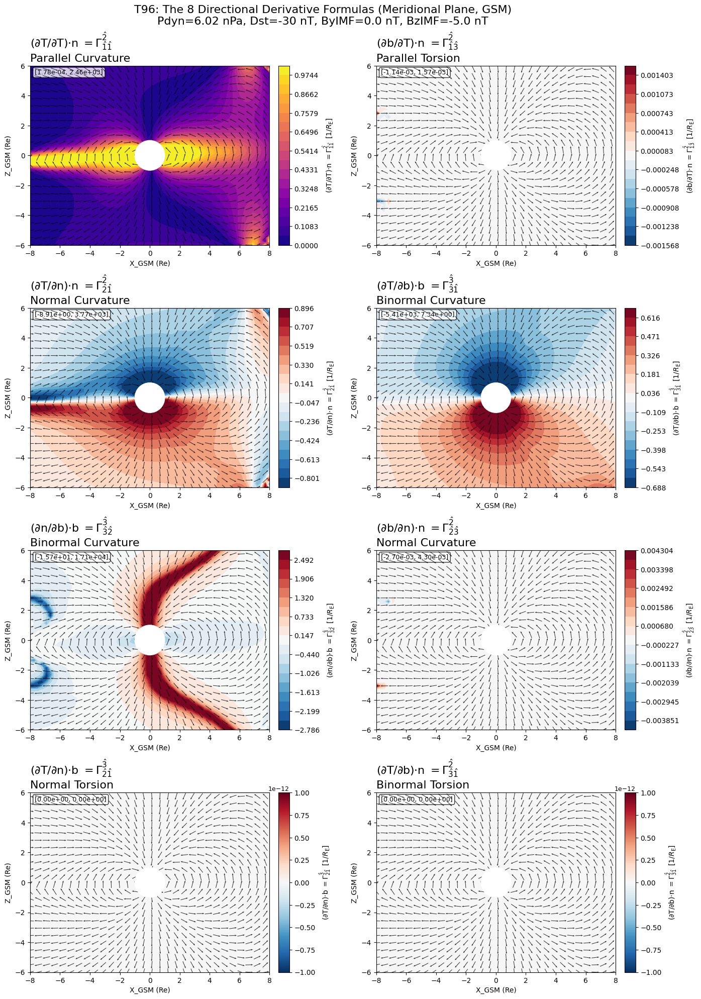

In [13]:
print("\nCalculating directional derivatives (T96, Meridional plane GSM)...")
derivatives_mer = compute_derivatives_flat(parmod, ps, x_mer_flat, y_mer_flat, z_mer_flat)

curvature_mer, torsion_mer = get_curvature_torsion_from_derivatives(derivatives_mer)
print(f"Curvature range (mer): {np.nanmin(curvature_mer):.3f} to {np.nanmax(curvature_mer):.3f} 1/Re")
print(f"Torsion   range (mer): {np.nanmin(torsion_mer):.3e} to {np.nanmax(torsion_mer):.3e} 1/Re")

params_mer = reshape_and_clip_derivatives(derivatives_mer, X_mer.shape, keys=(main_keys + anti_keys))

errors_mer = verify_antisymmetry_relations(derivatives_mer)
print_antisymmetry(errors_mer, "\nAntisymmetry verification (Meridional; max errors):")

segments_mer, dot_x_mer, dot_z_mer = build_overlay_segments_and_dots_meridional_field(
    X_mer, Z_mer, Y_mer, t96_total_field, parmod, ps
)

plot_8_panels(
    X_mer, Z_mer,
    params_mer,
    segments_mer, dot_x_mer, dot_z_mer,
    xlabel="X_GSM (Re)", ylabel="Z_GSM (Re)",
    xlim=(x_mer.min(), x_mer.max()), ylim=(z_mer.min(), z_mer.max()),
    suptitle="T96: The 8 Directional Derivative Formulas (Meridional Plane, GSM)",
    sw_title_line=sw_title,
    figsize=(16, 22),
    add_earth=True
)



  -------------------------

  ADD: 9 distributions on GSM X-Z at Y_GSM = -3

  -------------------------

/tmp/ipykernel_29786/2707510624.py:70: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(h_pad=TIGHT_HPAD, w_pad=TIGHT_WPAD, pad=0.3)


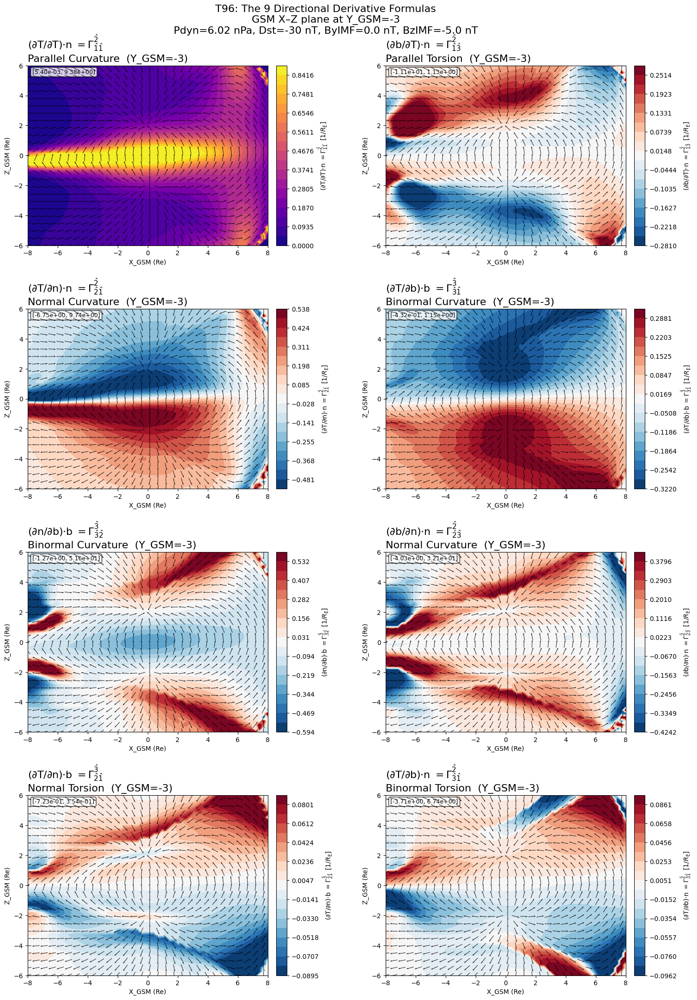

In [14]:
plot_mainkeys_xz_at_y(parmod, y0=-3.0, sw_title_line=sw_title)



  -------------------------

  2) MAGNETIC EQUATOR (SM z=0 plane, computed in GSM)

  -------------------------


Calculating directional derivatives (T96, Magnetic equator: SM z=0 grid -> compute in GSM)...
Curvature range (eq): 0.014 to 224.492 1/Re
Torsion   range (eq): -2.297e+00 to 2.297e+00 1/Re

Antisymmetry verification (Magnetic equator; max errors):
κ_check              = 9.00e-04
τ_check              = 5.48e-06
zero_check_1         = 0.00e+00
dT_dn_n_check        = 5.82e-04
dT_dn_b_check        = 1.04e-06
dn_dn_b_check        = 2.29e-06
dn_db_b_check        = 1.70e-05
dn_db_T_check        = 1.91e-03
db_db_T_check        = 1.51e-05


/tmp/ipykernel_29786/2471077535.py:57: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(h_pad=TIGHT_HPAD, w_pad=TIGHT_WPAD, pad=0.3)


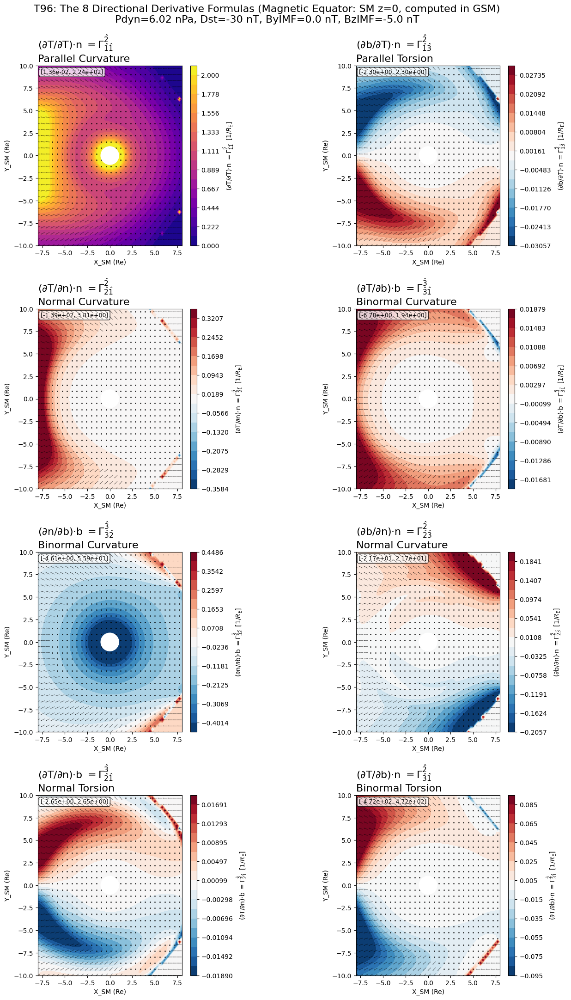

In [15]:
print("\nCalculating directional derivatives (T96, Magnetic equator: SM z=0 grid -> compute in GSM)...")
derivatives_eq = compute_derivatives_flat(parmod, ps, x_eq_flat, y_eq_flat, z_eq_flat)

curvature_eq, torsion_eq = get_curvature_torsion_from_derivatives(derivatives_eq)
print(f"Curvature range (eq): {np.nanmin(curvature_eq):.3f} to {np.nanmax(curvature_eq):.3f} 1/Re")
print(f"Torsion   range (eq): {np.nanmin(torsion_eq):.3e} to {np.nanmax(torsion_eq):.3e} 1/Re")

params_eq = reshape_and_clip_derivatives(derivatives_eq, X_sm.shape, keys=(main_keys + anti_keys))

errors_eq = verify_antisymmetry_relations(derivatives_eq)
print_antisymmetry(errors_eq, "\nAntisymmetry verification (Magnetic equator; max errors):")

segments_eq, dot_x_eq, dot_y_eq = build_overlay_segments_and_dots_equator_sm_field(
    X_sm, Y_sm, X_eq_gsm, Y_eq_gsm, Z_eq_gsm,
    t96_total_field, parmod, ps
)

plot_8_panels(
    X_sm, Y_sm,
    params_eq,
    segments_eq, dot_x_eq, dot_y_eq,
    xlabel="X_SM (Re)", ylabel="Y_SM (Re)",
    xlim=(x_sm.min(), x_sm.max()), ylim=(y_sm.min(), y_sm.max()),
    suptitle="T96: The 8 Directional Derivative Formulas (Magnetic Equator: SM z=0, computed in GSM)",
    sw_title_line=sw_title,
    figsize=(16, 24),
    add_earth=True
)


/tmp/ipykernel_29786/2471077535.py:57: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(h_pad=TIGHT_HPAD, w_pad=TIGHT_WPAD, pad=0.3)


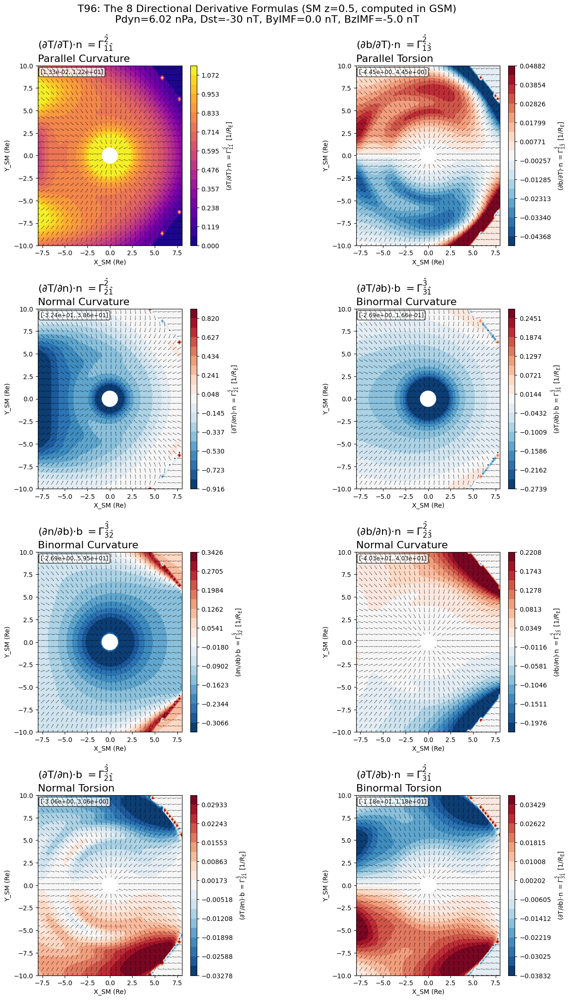

In [16]:
plot_8_panels_sm_z_plane(
    parmod, z_sm0=0.5,
    sw_title_line=sw_title,
    suptitle="T96: The 8 Directional Derivative Formulas (SM z=0.5, computed in GSM)",
    figsize=(16, 24),
)



  ## Extra 4 panels (SM magnetic equator): dn_db_T, db_dn_T, FAC proxy, ratio

  （元コードの式・表示スタイルを維持）

/tmp/ipykernel_29786/2586767734.py:66: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(h_pad=TIGHT_HPAD, w_pad=TIGHT_WPAD, pad=0.3)


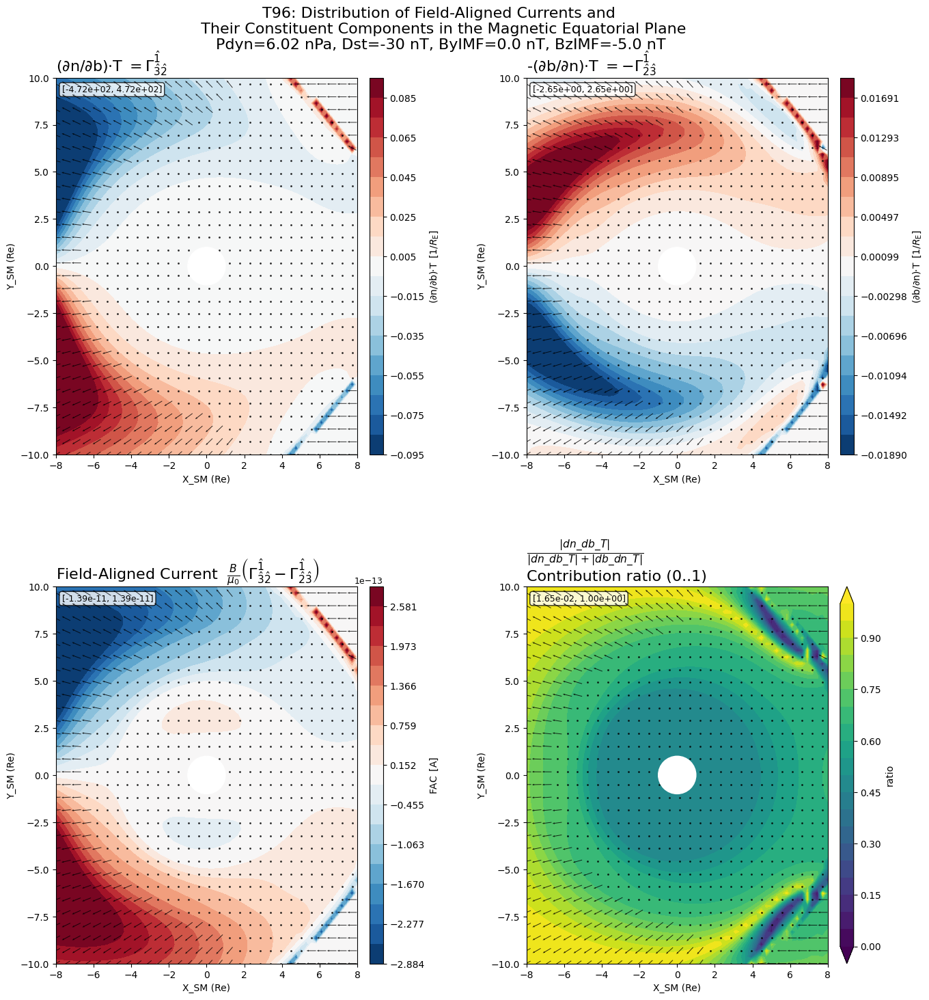

In [17]:
dn_db_T = params_eq["dn_db_T"]
db_dn_T = params_eq["db_dn_T"]

bx, by, bz = t96_total_field(parmod, ps, X_eq_gsm, Y_eq_gsm, Z_eq_gsm)
Bmag_nT = np.sqrt(bx**2 + by**2 + bz**2)

FAC, ratio = compute_fac_proxy_and_ratio(Bmag_nT, dn_db_T, db_dn_T)

fig = plt.figure(figsize=(16, 16))
gs = GridSpec(2, 2, figure=fig, hspace=0.35, wspace=0.25)
axes = [fig.add_subplot(gs[r, c]) for r in range(2) for c in range(2)]

panels = [
    dict(
        data=dn_db_T, cmap="RdBu_r", pname="residual",
        formula="", title=r"(∂n/∂b)·T $=\Gamma^{\hat{1}}_{\hat{3}\hat{2}}$",
        cbar_label=r"(∂n/∂b)·T", unit="1/Re", force_levels=None
    ),
    dict(
        data=-db_dn_T, cmap="RdBu_r", pname="residual",
        formula="", title=r"-(∂b/∂n)·T $=-\Gamma^{\hat{1}}_{\hat{2}\hat{3}}$",
        cbar_label=r"(∂b/∂n)·T", unit="1/Re", force_levels=None
    ),
    dict(
        data=FAC, cmap="RdBu_r", pname="residual",
        formula="", title=r"Field-Aligned Current  $ \frac{B}{\mu_0}\left(\Gamma^{\hat{1}}_{\hat{3}\hat{2}}-\Gamma^{\hat{1}}_{\hat{2}\hat{3}}\right)$",
        cbar_label="FAC", unit="A", force_levels=None
    ),
    dict(
        data=ratio, cmap="viridis", pname="ratio",
        formula=r"$\frac{|dn\_db\_T|}{|dn\_db\_T|+|db\_dn\_T|}$",
        title="Contribution ratio (0..1)",
        cbar_label="ratio", unit="", force_levels=np.linspace(0, 1, 21)
    ),
]

for ax, P in zip(axes, panels):
    data = P["data"]
    if P["force_levels"] is not None:
        im = plot_scalar_on_grid(ax, X_sm, Y_sm, data, P["cmap"], P["pname"], force_levels=P["force_levels"])
    else:
        im = plot_scalar_on_grid(ax, X_sm, Y_sm, data, P["cmap"], P["pname"])

    if segments_eq is not None:
        add_micro_arrows(ax, segments_eq, alpha=0.8)
    if dot_x_eq.size > 0:
        ax.scatter(dot_x_eq, dot_y_eq, s=dot_size, marker='o', c='k',
                   alpha=dot_alpha, linewidths=0)

    ax.add_patch(plt.Circle((0, 0), 1, color='white', zorder=10))
    ax.set_xlabel("X_SM (Re)")
    ax.set_ylabel("Y_SM (Re)")
    set_panel_title(ax, P["formula"], P["title"])
    ax.set_aspect("equal")
    ax.set_xlim(np.nanmin(X_sm), np.nanmax(X_sm))
    ax.set_ylim(np.nanmin(Y_sm), np.nanmax(Y_sm))

    add_colorbar(fig, ax, im, P["cbar_label"], unit=P["unit"])

    ax.text(
        0.02, 0.98, f"[{np.nanmin(data):.2e}, {np.nanmax(data):.2e}]",
        transform=ax.transAxes, fontsize=9, va='top',
        bbox=dict(boxstyle='round', facecolor='white', alpha=0.8)
    )

fig.tight_layout(h_pad=TIGHT_HPAD, w_pad=TIGHT_WPAD, pad=0.3)
fig.subplots_adjust(top=0.92)
fig.suptitle(
    "T96: Distribution of Field-Aligned Currents and \n Their Constituent Components in the Magnetic Equatorial Plane\n"
    f"{sw_title}",
    fontsize=16, y=0.985
)
finish_figure(fig, f"FAC4_SM_z0_baseline__{sw_title}", show=True, close=True)



  -------------------------

  ADD: FAC-related 4 panels on GSM X-Z at Y_GSM = -3 (baseline)

  -------------------------

/tmp/ipykernel_29786/2707510624.py:143: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(h_pad=TIGHT_HPAD, w_pad=TIGHT_WPAD, pad=0.3)


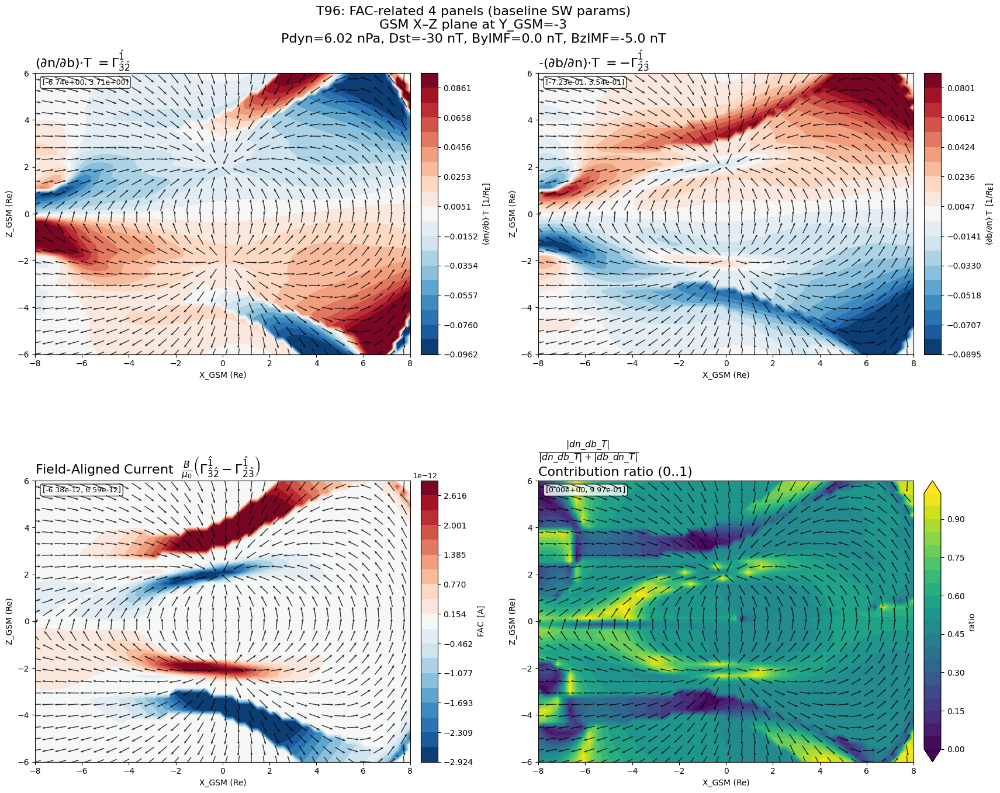

In [18]:
plot_fac_4panels_xz_at_y(
    parmod, y0=-3.0,
    suptitle_prefix="T96: FAC-related 4 panels (baseline SW params)",
    sw_title_line=sw_title
)


/tmp/ipykernel_29786/871290028.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(h_pad=TIGHT_HPAD, w_pad=TIGHT_WPAD, pad=0.3)


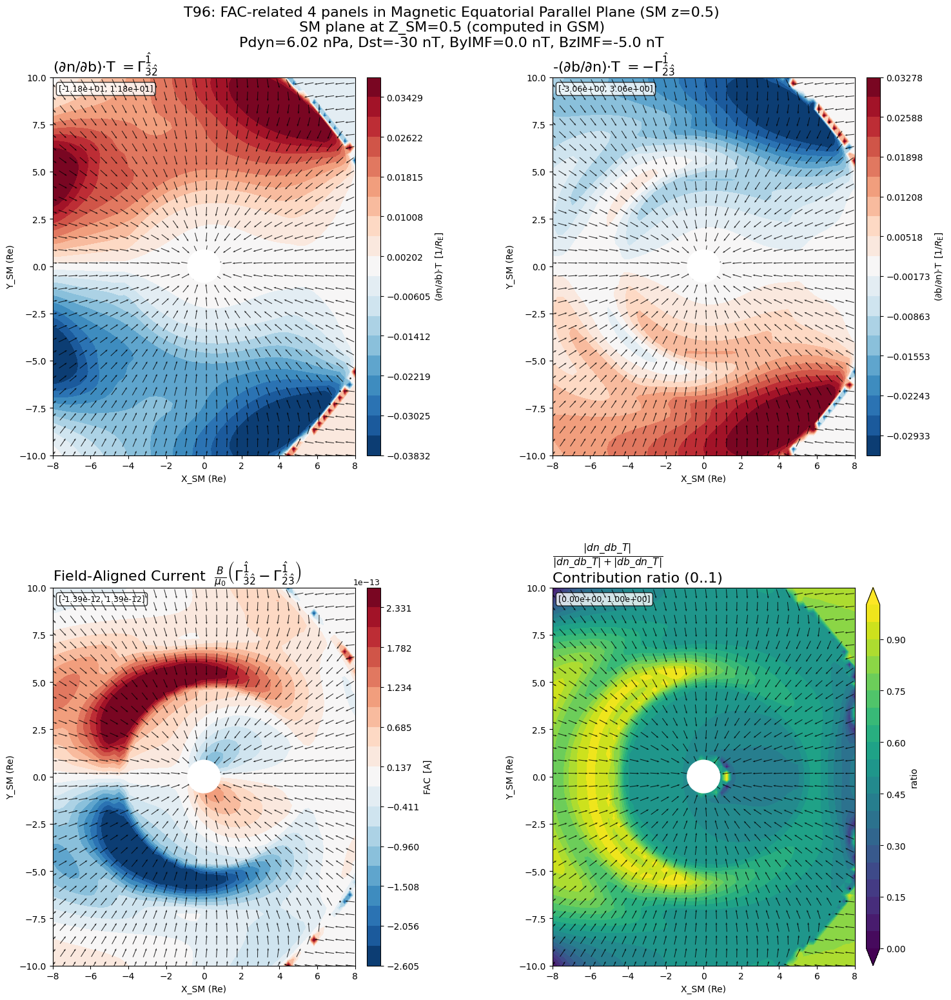

In [19]:
plot_fac_4panels_sm_z_plane(
    parmod, z_sm0=0.5,
    sw_title_line=sw_title,
    suptitle_prefix="T96: FAC-related 4 panels in Magnetic Equatorial Parallel Plane (SM z=0.5)",
)


  ============================================================

  NEW SW params: n=15/cm^3, V=650 km/s, Bz=-15 nT, Dst=-150 nT

  ============================================================

In [20]:
density_cm3_new = 15.0
v_kms_new = 650.0
BzIMF_new = -15.0
Dst_new   = -150.0
ByIMF_new = 0.0

parmod_new, Pdyn_new = make_parmod_from_sw(
    density_cm3=density_cm3_new, v_kms=v_kms_new,
    dst_nT=Dst_new, by_nT=ByIMF_new, bz_nT=BzIMF_new
)

sw_title_new = (
    f"Pdyn={Pdyn_new:.2f} nPa, Dst={Dst_new:.0f} nT, "
    f"ByIMF={ByIMF_new:.1f} nT, BzIMF={BzIMF_new:.1f} nT"
)
print(sw_title_new)



Pdyn=10.60 nPa, Dst=-150 nT, ByIMF=0.0 nT, BzIMF=-15.0 nT


  ADD: 8-panel (Meridional Plane, GSM Y=0) for NEW SW params

  -------------------------


[NEW SW] Calculating directional derivatives (T96, Meridional plane GSM)...
[NEW SW] Curvature range (mer): 0.000 to 15.361 1/Re
[NEW SW] Torsion   range (mer): -2.055e-04 to 2.379e-04 1/Re

[NEW SW] Antisymmetry verification (Meridional; max errors):
κ_check              = 1.40e-03
τ_check              = 7.00e-17
zero_check_1         = 0.00e+00
dT_dn_n_check        = 1.25e-03
dT_dn_b_check        = 0.00e+00
dn_dn_b_check        = 5.48e-16
dn_db_b_check        = 5.94e-06
dn_db_T_check        = 6.30e-04
db_db_T_check        = 6.85e-05


/tmp/ipykernel_29786/2471077535.py:57: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(h_pad=TIGHT_HPAD, w_pad=TIGHT_WPAD, pad=0.3)


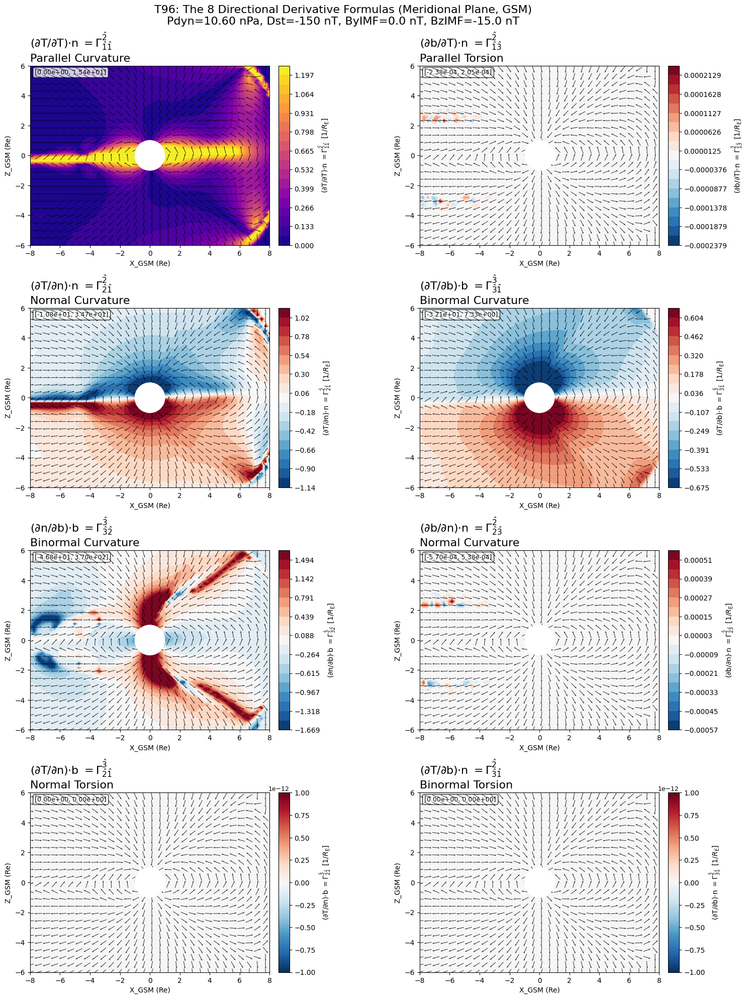

/tmp/ipykernel_29786/2707510624.py:70: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(h_pad=TIGHT_HPAD, w_pad=TIGHT_WPAD, pad=0.3)


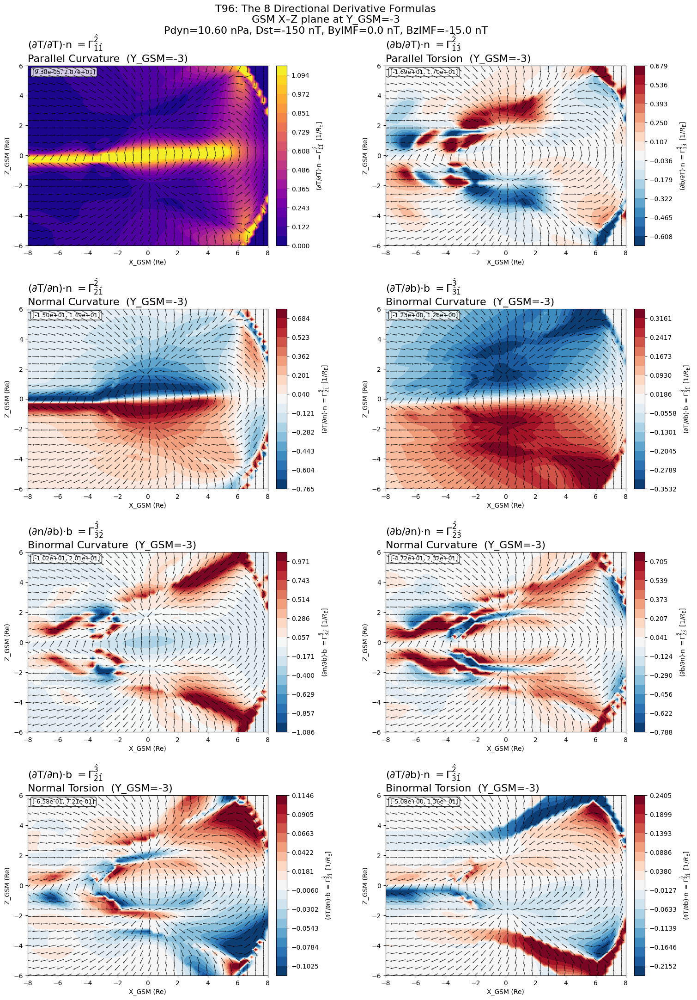

In [21]:
print("\n[NEW SW] Calculating directional derivatives (T96, Meridional plane GSM)...")
derivatives_mer_new = compute_derivatives_flat(parmod_new, ps, x_mer_flat, y_mer_flat, z_mer_flat)

curvature_mer_new, torsion_mer_new = get_curvature_torsion_from_derivatives(derivatives_mer_new)
print(f"[NEW SW] Curvature range (mer): {np.nanmin(curvature_mer_new):.3f} to {np.nanmax(curvature_mer_new):.3f} 1/Re")
print(f"[NEW SW] Torsion   range (mer): {np.nanmin(torsion_mer_new):.3e} to {np.nanmax(torsion_mer_new):.3e} 1/Re")

params_mer_new = reshape_and_clip_derivatives(derivatives_mer_new, X_mer.shape, keys=(main_keys + anti_keys))

errors_mer_new = verify_antisymmetry_relations(derivatives_mer_new)
print_antisymmetry(errors_mer_new, "\n[NEW SW] Antisymmetry verification (Meridional; max errors):")

segments_mer_new, dot_x_mer_new, dot_z_mer_new = build_overlay_segments_and_dots_meridional_field(
    X_mer, Z_mer, Y_mer, t96_total_field, parmod_new, ps
)

plot_8_panels(
    X_mer, Z_mer,
    params_mer_new,
    segments_mer_new, dot_x_mer_new, dot_z_mer_new,
    xlabel="X_GSM (Re)", ylabel="Z_GSM (Re)",
    xlim=(x_mer.min(), x_mer.max()), ylim=(z_mer.min(), z_mer.max()),
    suptitle="T96: The 8 Directional Derivative Formulas (Meridional Plane, GSM)",
    sw_title_line=sw_title_new,
    figsize=(18, 22),
    add_earth=True
)

plot_mainkeys_xz_at_y(
    parmod_new, y0=-3.0,
    sw_title_line=sw_title_new,
    suptitle_prefix="T96: The 8 Directional Derivative Formulas"
)



  -------------------------

  Recompute derivatives on SM equator grid (computed in GSM) [NEW SW]

  -------------------------

Recomputing directional derivatives on magnetic equator (SM z=0 grid -> GSM compute) ...

[NEW SW] Antisymmetry verification (Magnetic equator; max errors):
κ_check              = 2.27e-04
τ_check              = 1.54e-06
zero_check_1         = 0.00e+00
dT_dn_n_check        = 1.43e-04
dT_dn_b_check        = 8.80e-08
dn_dn_b_check        = 7.13e-07
dn_db_b_check        = 8.85e-07
dn_db_T_check        = 2.67e-04
db_db_T_check        = 3.83e-06


/tmp/ipykernel_29786/2471077535.py:57: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(h_pad=TIGHT_HPAD, w_pad=TIGHT_WPAD, pad=0.3)


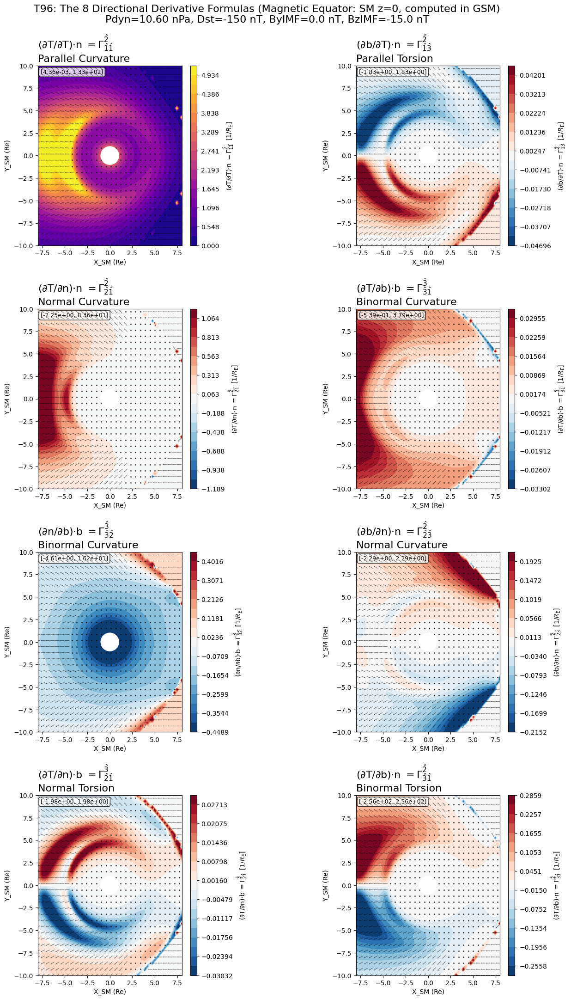

In [22]:
print("Recomputing directional derivatives on magnetic equator (SM z=0 grid -> GSM compute) ...")
derivatives_eq_new = compute_derivatives_flat(parmod_new, ps, x_eq_flat, y_eq_flat, z_eq_flat)

params_eq_new = reshape_and_clip_derivatives(derivatives_eq_new, X_sm.shape, keys=(main_keys + anti_keys))

errors_eq_new = verify_antisymmetry_relations(derivatives_eq_new)
print_antisymmetry(errors_eq_new, "\n[NEW SW] Antisymmetry verification (Magnetic equator; max errors):")

segments_eq_new, dot_x_eq_new, dot_y_eq_new = build_overlay_segments_and_dots_equator_sm_field(
    X_sm, Y_sm, X_eq_gsm, Y_eq_gsm, Z_eq_gsm,
    t96_total_field, parmod_new, ps
)

plot_8_panels(
    X_sm, Y_sm,
    params_eq_new,
    segments_eq_new, dot_x_eq_new, dot_y_eq_new,
    xlabel="X_SM (Re)", ylabel="Y_SM (Re)",
    xlim=(x_sm.min(), x_sm.max()), ylim=(y_sm.min(), y_sm.max()),
    suptitle="T96: The 8 Directional Derivative Formulas (Magnetic Equator: SM z=0, computed in GSM)",
    sw_title_line=sw_title_new,
    figsize=(16, 24),
    add_earth=True
)


/tmp/ipykernel_29786/2471077535.py:57: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(h_pad=TIGHT_HPAD, w_pad=TIGHT_WPAD, pad=0.3)


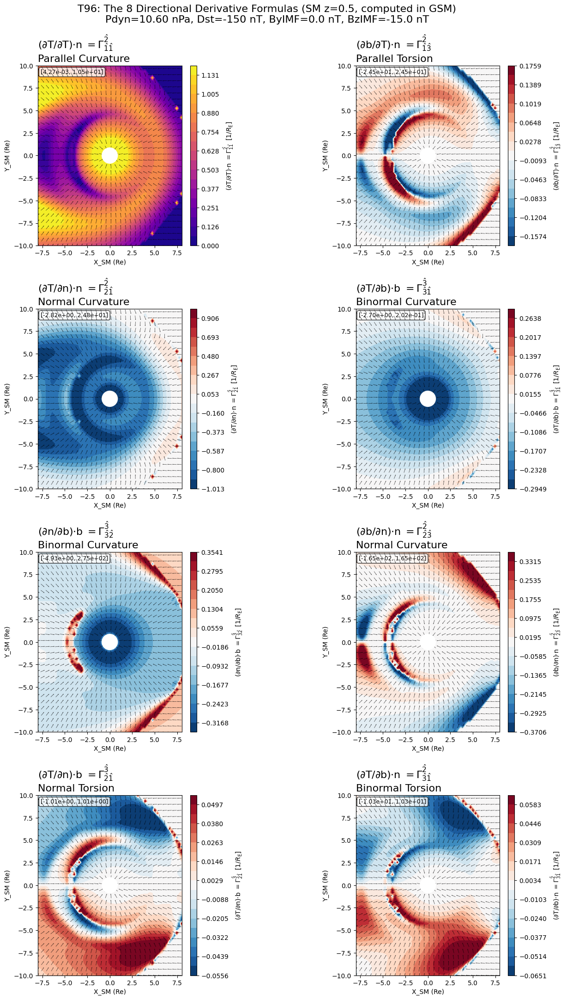

In [23]:
plot_8_panels_sm_z_plane(
    parmod_new, z_sm0=0.5,
    sw_title_line=sw_title_new,
    suptitle="T96: The 8 Directional Derivative Formulas (SM z=0.5, computed in GSM)",
    figsize=(16, 24),
)


  4 panels (NEW SW) on SM magnetic equator

  -------------------------

/tmp/ipykernel_29786/421318240.py:66: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(h_pad=TIGHT_HPAD, w_pad=TIGHT_WPAD, pad=0.3)


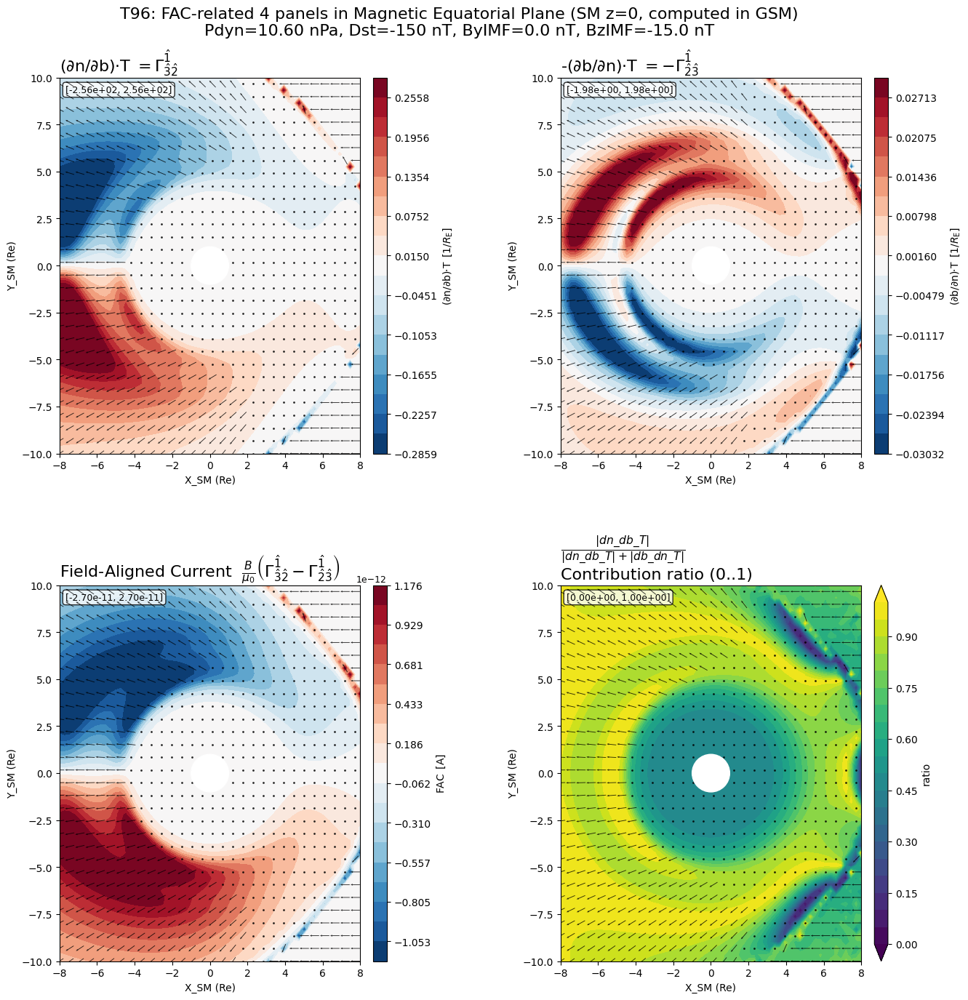

In [24]:
dn_db_T_new = _clip_small(derivatives_eq_new["dn_db_T"].reshape(X_sm.shape), delta_min)
db_dn_T_new = _clip_small(derivatives_eq_new["db_dn_T"].reshape(X_sm.shape), delta_min)

bx_new, by_new, bz_new = t96_total_field(parmod_new, ps, X_eq_gsm, Y_eq_gsm, Z_eq_gsm)
Bmag_nT_new = np.sqrt(bx_new**2 + by_new**2 + bz_new**2)

FAC_new, ratio_new = compute_fac_proxy_and_ratio(Bmag_nT_new, dn_db_T_new, db_dn_T_new)

fig = plt.figure(figsize=(16, 15))
gs = GridSpec(2, 2, figure=fig, hspace=0.35, wspace=0.25)
axes = [fig.add_subplot(gs[r, c]) for r in range(2) for c in range(2)]

panels_new = [
    dict(
        data=dn_db_T_new, cmap="RdBu_r", pname="residual",
        formula="", title=r"(∂n/∂b)·T $=\Gamma^{\hat{1}}_{\hat{3}\hat{2}}$",
        cbar_label=r"(∂n/∂b)·T", unit="1/Re", force_levels=None
    ),
    dict(
        data=-db_dn_T_new, cmap="RdBu_r", pname="residual",
        formula="", title=r"-(∂b/∂n)·T $=-\Gamma^{\hat{1}}_{\hat{2}\hat{3}}$",
        cbar_label=r"(∂b/∂n)·T", unit="1/Re", force_levels=None
    ),
    dict(
        data=FAC_new, cmap="RdBu_r", pname="residual",
        formula="", title=r"Field-Aligned Current  $ \frac{B}{\mu_0}\left(\Gamma^{\hat{1}}_{\hat{3}\hat{2}}-\Gamma^{\hat{1}}_{\hat{2}\hat{3}}\right)$",
        cbar_label="FAC", unit="A", force_levels=None
    ),
    dict(
        data=ratio_new, cmap="viridis", pname="ratio",
        formula=r"$\frac{|dn\_db\_T|}{|dn\_db\_T|+|db\_dn\_T|}$",
        title="Contribution ratio (0..1)",
        cbar_label="ratio", unit="", force_levels=np.linspace(0, 1, 21)
    ),
]

for ax, P in zip(axes, panels_new):
    data = P["data"]
    if P["force_levels"] is not None:
        im = plot_scalar_on_grid(ax, X_sm, Y_sm, data, P["cmap"], P["pname"], force_levels=P["force_levels"])
    else:
        im = plot_scalar_on_grid(ax, X_sm, Y_sm, data, P["cmap"], P["pname"])

    if segments_eq_new is not None:
        add_micro_arrows(ax, segments_eq_new, alpha=0.8)
    if dot_x_eq_new.size > 0:
        ax.scatter(dot_x_eq_new, dot_y_eq_new, s=dot_size, marker='o', c='k',
                   alpha=dot_alpha, linewidths=0)

    ax.add_patch(plt.Circle((0, 0), 1, color='white', zorder=10))
    ax.set_xlabel("X_SM (Re)")
    ax.set_ylabel("Y_SM (Re)")
    set_panel_title(ax, P["formula"], P["title"])
    ax.set_aspect("equal")
    ax.set_xlim(np.nanmin(X_sm), np.nanmax(X_sm))
    ax.set_ylim(np.nanmin(Y_sm), np.nanmax(Y_sm))

    add_colorbar(fig, ax, im, P["cbar_label"], unit=P["unit"])

    ax.text(
        0.02, 0.98, f"[{np.nanmin(data):.2e}, {np.nanmax(data):.2e}]",
        transform=ax.transAxes, fontsize=9, va='top',
        bbox=dict(boxstyle='round', facecolor='white', alpha=0.8)
    )

fig.tight_layout(h_pad=TIGHT_HPAD, w_pad=TIGHT_WPAD, pad=0.3)
fig.subplots_adjust(top=0.92)
fig.suptitle(
    "T96: FAC-related 4 panels in Magnetic Equatorial Plane (SM z=0, computed in GSM)\n"
    f"{sw_title_new}",
    fontsize=16, y=0.985
)
finish_figure(fig, f"FAC4_SM_z0_{sw_title_new}", show=True, close=True)



  -------------------------

  ADD: FAC-related 4 panels on GSM X-Z at Y_GSM = -3 (NEW SW)

  -------------------------

/tmp/ipykernel_29786/2707510624.py:143: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(h_pad=TIGHT_HPAD, w_pad=TIGHT_WPAD, pad=0.3)


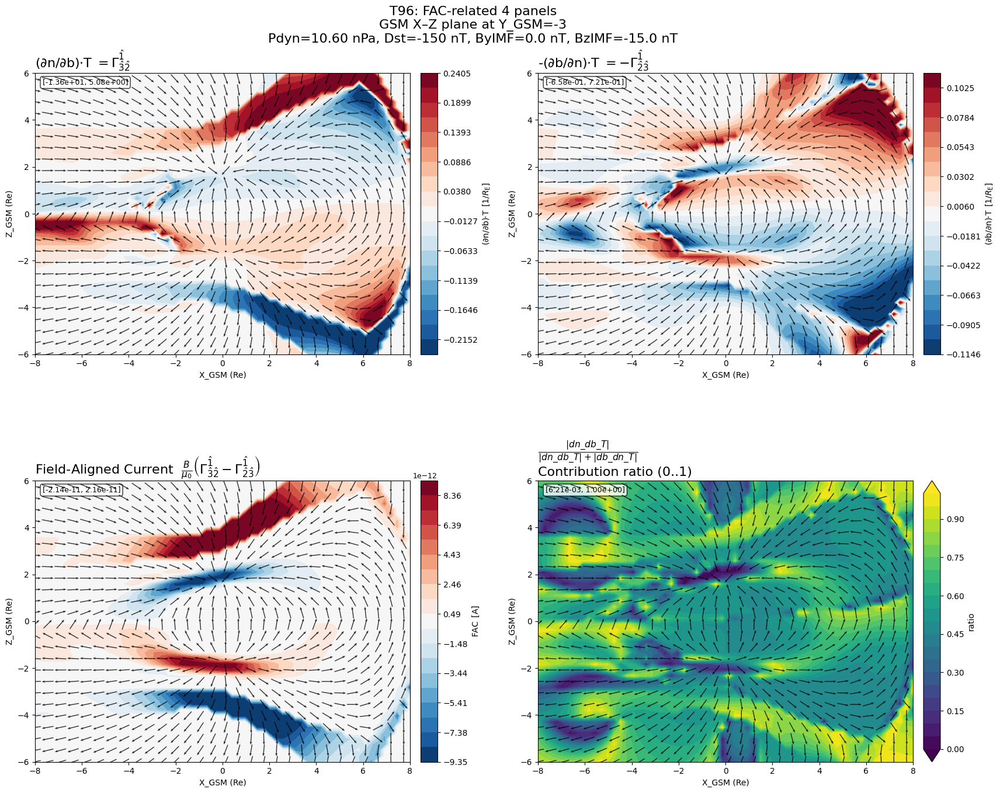

In [25]:
plot_fac_4panels_xz_at_y(
    parmod_new, y0=-3.0,
    suptitle_prefix="T96: FAC-related 4 panels",
    sw_title_line=sw_title_new
)


/tmp/ipykernel_29786/871290028.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(h_pad=TIGHT_HPAD, w_pad=TIGHT_WPAD, pad=0.3)


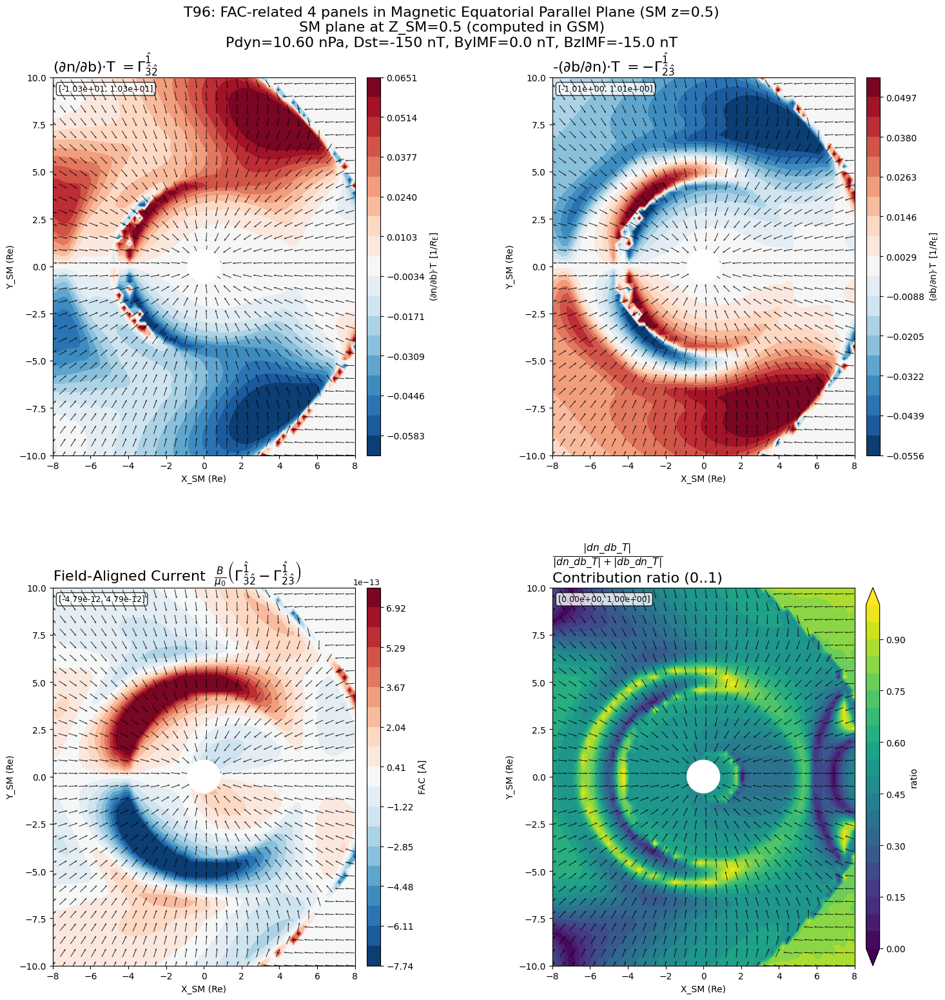

In [26]:
plot_fac_4panels_sm_z_plane(
    parmod_new, z_sm0=0.5,
    sw_title_line=sw_title_new,
    suptitle_prefix="T96: FAC-related 4 panels in Magnetic Equatorial Parallel Plane (SM z=0.5)",
)
